## Imports

In [1]:
# imports
import tensorflow as tf
import keras

import os
os.environ["SM_FRAMEWORK"] = 'tf.keras'
# %env SM_FRAMEWORK=tf.keras

import gc

import segmentation_models as sm

import albumentations as A


from transformers import TFAutoModelForSemanticSegmentation, TFSegformerForSemanticSegmentation
from transformers.keras_callbacks import KerasMetricCallback


import numpy as np

import matplotlib.pyplot as plt
from PIL import Image

import myFunction as mf
%load_ext autoreload
    
%autoreload 2

import time

import pandas as pd

from joblib import dump, load

import xplique
from xplique.attributions import HsicAttributionMethod, SobolAttributionMethod


from xplique.utils_functions.segmentation import get_connected_zone, get_in_out_border


Segmentation Models: using `tf.keras` framework.


In [2]:
# for requierements.txt
# pipreqs --force --ignore Patin_Clement_2_API_042024, Patin_Clement_3_application_Flask_042024  --scan-notebooks

In [3]:
# create folders for saving
if not os.path.isdir("mySaves"):
    os.mkdir("mySaves")

# results
if not os.path.isdir("mySaves/results"):
    os.mkdir("mySaves/results")
# images tests
if not os.path.isdir("mySaves/images_tests"):
    os.mkdir("mySaves/images_tests")
# mean and std of cityscapes
if not os.path.isdir("mySaves/cityscapes_mean_std"):
    os.mkdir("mySaves/cityscapes_mean_std")
# explainability
if not os.path.isdir("mySaves/explainability"):
    os.mkdir("mySaves/explainability")

# for production
if not os.path.isdir("Patin_Clement_4_code_dashboard_062024"):
    os.mkdir("Patin_Clement_4_code_dashboard_062024")
# api
if not os.path.isdir("Patin_Clement_4_code_dashboard_062024/backend"):
    os.mkdir("Patin_Clement_4_code_dashboard_062024/backend")
# models
if not os.path.isdir("Patin_Clement_4_code_dashboard_062024/backend/models"):
    os.mkdir("Patin_Clement_4_code_dashboard_062024/backend/models")
# dashboard
if not os.path.isdir("Patin_Clement_4_code_dashboard_062024/frontend"):
    os.mkdir("Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints")
# test images
if not os.path.isdir("Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_images"):
    os.mkdir("Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_images")
if not os.path.isdir("Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_masks"):
    os.mkdir("Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_masks")

## Nos données

Le dataset d'entraînement est ***Cityscape***, qui comporte notamment des photos prises depuis un véhicule ainsi que les masques associés. Le masque d'une photo est une image dont les valeurs des pixels correspondent aux différentes catégories d'objets/zones que l'on cherche à distinguer.

Le jeu de données est séparé en deux parties : les images, contenues dans `P8_Cityscapes_leftImg8bit_trainvaltest`, et les masks (notre target), contenus dans `P8_Cityscapes_gtFine_trainvaltest`.
Il est composé de 4 types d'informations de mask :
-	Masks couleur : chaque classe se voit attribuer une couleur différente.
-	Masks d'identifiant d'instance : masques en niveaux de gris étiquetés avec des identifiants d'instance (chaque élément différent se voit attribuer une classe et un identifiant d'objet unique)
-	**Identifiants d'étiquette : mask en niveaux de gris étiqueté avec l'identifiant de classe. Comme nous souhaitons faire de la segmentation sémantique, ce sont ces fichiers que nous utilisons**
-	Polygones de masque : incluent les coordonnées détaillées de chaque segment.
Un découpage préalable dans des dossiers `train` / `validation` / `test` a été effectué : 
-	Entraînement : 2975 images / masks
-	Validation : 500 images / masks
-	Test : 1525 images / masks

Le souci est que les masks de Test ne sont pas exploitables, avec des identifiants d’étiquettes absents.

Nous utilisons donc seulement les données `train` et `val` pour notre travail.

### Data generator, accéder aux données

Pour traiter ce dataset volumineux (11 Go), nous créons une sous classe de keras.utils.Sequence : `generator`. Celle-ci permet de manipuler le dataset à l’échelle d’un lot (un batch), et ainsi de ménager la mémoire vive. Outre le chargement des images, elle offre également la possibilité de prétraiter directement les données selon les besoins du projet. 
-	Récupère des chemins d’accès des images et des masks
-	(facultatif) Applique un échantillonnage `n_images`
-	(facultatif) Divise les données avec la fonction train_test_split de scikit-learn
-	Lit les images et les masks par lot, à la taille souhaitée `batch_size` (ici nous prendrons 32) et aux dimensions souhaitées `image_size`. Ici, nous réduisons la taille : (512 x 1024 x 3) --> (256 x 512 x 3), pour réduire le temps d’apprentissage
-	(facultatif) Applique de l’augmentation des données
-	(facultatif) Prétraite les images pour être compatibles avec un `backbone` donné
-	(facultatif) Effectue le mappage des classes en macro-catégories cats
-	Met les labels du mask dans leurs propres canaux (256 x 512) --> (256 x 512 x 8)
-	Met à disposition le batch créé
-	(facultatif) A la fin de chaque epoch, mélange les chemins d’accès des images/masks

In [4]:
# define shared "batch_size"
batch_size = 32
# define image_size
image_size = (256, 256*2)

Pour nous permettre de comparer les résultats entre notre baseline et le nouveau modèle, nous utiliserons les mêmes sets d'entraînement, de validation et de test. Pour cela utiliserons :
- les données `train` comme **set d'entraînement**
- **70%** des données `val` comme **set de validation**
- les **30%** restants du dossier `val` comme **set de test**

Nous utiliserons également la même taille de *batch*.

In [5]:
# define shared "random_state" for creating the validation and test generators
same_random_state = 16
same_test_size = 0.3

### Macro-catégories

Pour le projet, nous n'utilisons pas la totalité des 32 catégories présentes dans le dataset. Nous les regroupons en 8 macro-catégories :

In [6]:
# dictionnary macro / micro classes
cats = {'void': [0, 1, 2, 3, 4, 5, 6],
 'flat': [7, 8, 9, 10],
 'construction': [11, 12, 13, 14, 15, 16],
 'object': [17, 18, 19, 20],
 'nature': [21, 22],
 'sky': [23],
 'human': [24, 25],
 'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]}

Pour la réprésentation graphique des masks prédits, nous définissons un mapping de couleur pour ces classes :

In [7]:
# array with RGB colors, one for each macro class
cats_colors = np.array([
        [0, 0, 0],
        [128, 64, 128],
        [70, 70, 70],
        [153, 153, 153],
        [107, 142, 35],
        [70, 130, 180],
        [220, 20, 60],
        [0, 0, 142]
])

## Augmentation de données

L'augmentation de données **crée artificiellement plus de données pour l'entraînement**, augmentant la **robustesse** du modèle.

C’est une technique pour lutter contre le sur-apprentissage. L'augmentation de données expose les modèles à une plus grande variété de données, ce qui les empêche de trop s'adapter au set d'entraînement et améliore leur performance sur de nouvelles données.
Dans le domaine de la Computer Vision, celle-ci se traduit par **différentes techniques, qui peuvent être par exemple géométriques (comme une rotation) ou au niveau du pixel (comme des modifications de couleur)**.

Dans le cadre du projet précédent, nous avons montré l'**opportunité d'utiliser ces techniques d'augmentation de données**. Nous utiliserons donc la liste de transformations issue de cette recherche :

In [8]:
# define augmentations for training
list_of_transforms = [
    A.OneOf(
        [
            A.FancyPCA(p=1, alpha=1),
            A.HueSaturationValue(p=1, hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20),
            A.ColorJitter(p=1, brightness=0.2, contrast=0.2, saturation=0.2),
        ],
        p=0.5
    ),
    A.RandomShadow(
        p=0.5, 
        shadow_roi=(
            0, 0.4,
            1, 1
            ), 
        num_shadows_lower=1, 
        num_shadows_upper=4, 
        shadow_dimension=5
        ),
    A.CoarseDropout(
        p=0.5, 
        min_holes=2, 
        max_holes=8, 
        min_height=0.05, 
        max_height=0.1, 
        min_width=0.025, 
        max_width=0.05
        )
]

## Modélisation  - Généralités et hypothèses

Pour faire notre preuve de concept, nous comparerons le modèle `SegFormer` à un modèle *baseline* basé sur l'architecture `Unet` avec une *backbone* `Resnet`, qui était ressorti gagnant dans le cadre du projet 8.

### Métrique

Pour la **métrique d'évaluation**, nous utilisons la `mean IoU score` (ou *indice de Jaccard*), moyenne des *intersection over union* de chaque classe prédite. L'`IoU` est calculé en divisant l'aire de l'intersection entre la zone prédite par le modèle et la zone réelle de l'objet par l'aire de leur union. Il s'agit d'une mesure la similarité entre ces zones, qui se calcule donc comme le rapport entre :
- la zone correctement prédite (les TP)
<br>et<br>
- les zones correctement prédites (TP), incorrectement prédites (FP) et réelles non détectées (FN)

Nous capturons également le **temps d'entraînement** des modèles.


In [9]:
# define metrics
jaccard = sm.metrics.IOUScore(threshold=0.5)
metrics = [jaccard]

### Quelles variations de `SegFormer` et `Resnet` ?

Ces modèles possèdent plusieurs variations en terme de complexité / nombres de paramètres :
- `SegFormer` :  5 variantes, de *B0* à *B5*
- `Unet-Resnet` : 5 variantes, de *Resnet18* à *Resnet152*

Afin de comparer les deux algorithmes de segmentation dans les mêmes conditions, nous faisons le choix de sélectionner des **variantes équivalentes en termes de nombres de paramètres**.

Après plusieurs tests, nous avons **sélectionné le *SegFormer-B1*** (la version *B2* étant trop gourmande en capacités de calcul).

Paramètres **Segformer-B1** :

![](mySaves\devFiles\images\segformer_size.png)

Le modèle utilisé dans le cadre du projet 8 était le **Unet-Resnet34**, qui possèdent bien plus de paramètres :

![](mySaves\devFiles\images\resnet34_size.png)

Nous nous sommes alors tournés vers le **Unet-Resnet18** :

![](mySaves\devFiles\images\resnet18_size.png)

Nous avons donc bien **2 modèles avec des tailles similaires**.

### Réduction du temps d'apprentissage

Dans le cadre de la comparaison des 2 modèles, et afin de réduire le temps d’apprentissage, nous faisant le choix de limiter la taille des images à 512 x 256 pixels. Une adaptation sera nécessaire pour le modèle Segformer (comme développé plus bas), mais l'objectif est de se rapprocher d'une similarité en termes de données d'entraînement.

### Nombre d'`epochs`

Pour l’entraînement lui-même, nous fixerons un nombre d'epochs raisonnable à `10`, pour les 2 modèles.


In [10]:
# define the number of epochs
n_epochs = 10

### Fonction de perte

La fonction de perte « classique » pour les modèles de classification à plusieurs catégories est la *Categorical Cross Entropy*. 

Celle-ci n’est pas forcément la plus utilisée pour la segmentation. On lui préfère parfois la *Focal Loss*, qui en est une variation, et qui permet de pénaliser l’impact des exemples faciles et de mettre en avant les exemples les plus compliqués. On peut utiliser également la *Dice Loss* qui est calculé à partir du coefficient de Dice (`= 1- FScore`). Cette fonction de perte a la particularité de se calculer à l’échelle de globale.
Dans le cadre du projet 8 nous avions travaillé sur la fonction de perte les combinant et en jouant sur un paramètre `class_weights`. 

L'**implémenation du *Segformer* par Hugging Face est basée sur la *Categorical Cross Entropy*, aussi nous l'utiliserons également pour la *baseline***.

## Baseline : **U-net** avec backbone **Resnet18**

### Générateurs de données

Nous pouvons créer nos générateurs de données :

In [11]:
# use custom class "generator"

# backbone
backbone_name = 'resnet18'

# WITH augmentations for training
train_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    n_images=None,
    cats=cats,
    backbone = backbone_name,
    augmentation=A.Compose(list_of_transforms),
    shuffle=True
)
# for validation, use of 'val' folder
# split and keep 70%
valid_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=None,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)
# for test, use of 'val' folder again
# same split and keep remaining 30%
test_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=None,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)

### Modèle

Créons maintenant notre modèle `Unet-Resnet18` :

In [12]:
# input shape
input_shape = train_gen[0][0][0].shape
# the number of classes is given by the "cats" dictionnary
classes = len(cats)
# optimizer
optimizer = keras.optimizers.Adam()

# unet model with resnet backbone
unet_resnet18 = sm.Unet(
    backbone_name=backbone_name,
    input_shape=input_shape,
    classes=classes,
    activation="softmax"
)
# compile
unet_resnet18.compile(
    optimizer=optimizer,
    loss=sm.losses.CategoricalCELoss(),
    metrics=metrics
)
# print summary
unet_resnet18.summary()



Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 256, 512, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 256, 512, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 262, 518, 3)          0         ['bn_data[0][0]']             
 g2D)                                                                                             
                                                                                          

### Entraînement

Nous pouvons maintenant entraîner notre modèle `baseline` :

In [13]:
if "unet_resnet18_results.joblib" not in os.listdir("mySaves/results") :
    # use saved weights if they exists
    if "unet_resnet18.h5" in os.listdir("Patin_Clement_4_code_dashboard_062024/backend/models") :
        unet_resnet18.load_weights("Patin_Clement_4_code_dashboard_062024/backend/models/unet_resnet18.h5")
        training_time = load("mySaves/results/unet_resnet18_training_time.joblib")

    else :
        # initiate timer
        start = time.time()
        # fit
        history = unet_resnet18.fit(
            x=train_gen,
            steps_per_epoch=len(train_gen),
            epochs=n_epochs,
            validation_data=valid_gen,
        )
        # get training time
        training_time = time.time() - start
        # save
        unet_resnet18.save_weights("Patin_Clement_4_code_dashboard_062024/backend/models/unet_resnet18.h5")
        dump(training_time,"mySaves/results/unet_resnet18_training_time.joblib")
        dump(history.history, "mySaves/results/unet_resnet18_history.joblib")

    # compute scores on validation set
    scores = unet_resnet18.evaluate(valid_gen)
    dump(scores, "mySaves/results/unet_resnet18_results.joblib")

else :
    # load
    scores = load("mySaves/results/unet_resnet18_results.joblib")
    training_time = load("mySaves/results/unet_resnet18_training_time.joblib")
    history = load("mySaves/results/unet_resnet18_history.joblib")

Regardons la courbe d'apprentissage :

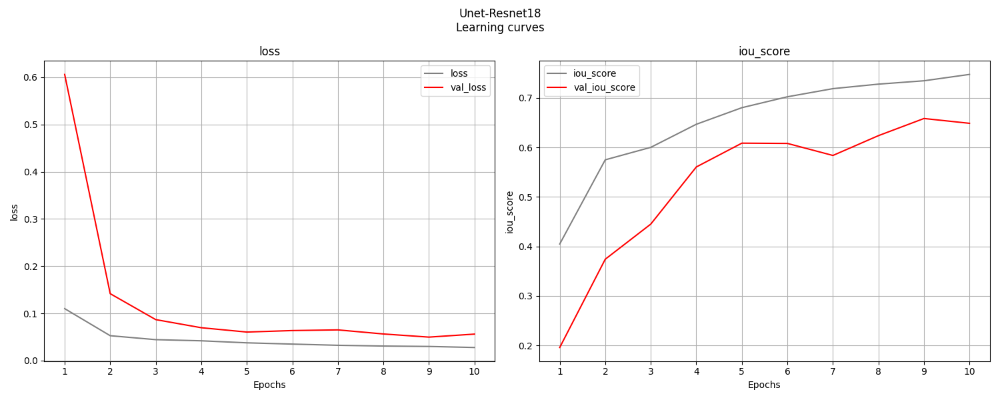

In [14]:
# use custom fonction to visualize some predictions
if "unet_resnet18_learning_curve.png" not in os.listdir("mySaves/results") :
    mf.plot_learning_curves(
        history_dict=history, 
        list_of_metrics=["loss", "iou_score"], 
        title="Unet-Resnet18\nLearning curves",
        save_path="mySaves/results/unet_resnet18_learning_curve.png")
else :
    display(keras.preprocessing.image.load_img("mySaves/results/unet_resnet18_learning_curve.png"))

Nous pouvons stocker le résultat dans un tableau :

In [15]:
# initiate a tab to store results
results_tab = pd.DataFrame(columns=["model", "backbone", "val_iou", "training_time"])
# add results
new_results = ["unet", "resnet18"] + scores[1:] + [training_time]
results_tab.loc[results_tab.shape[0],:] =  new_results
results_tab

,model,backbone,val_iou,training_time
0,unet,resnet18,0.648616,11669.756623


### Test sur quelques images

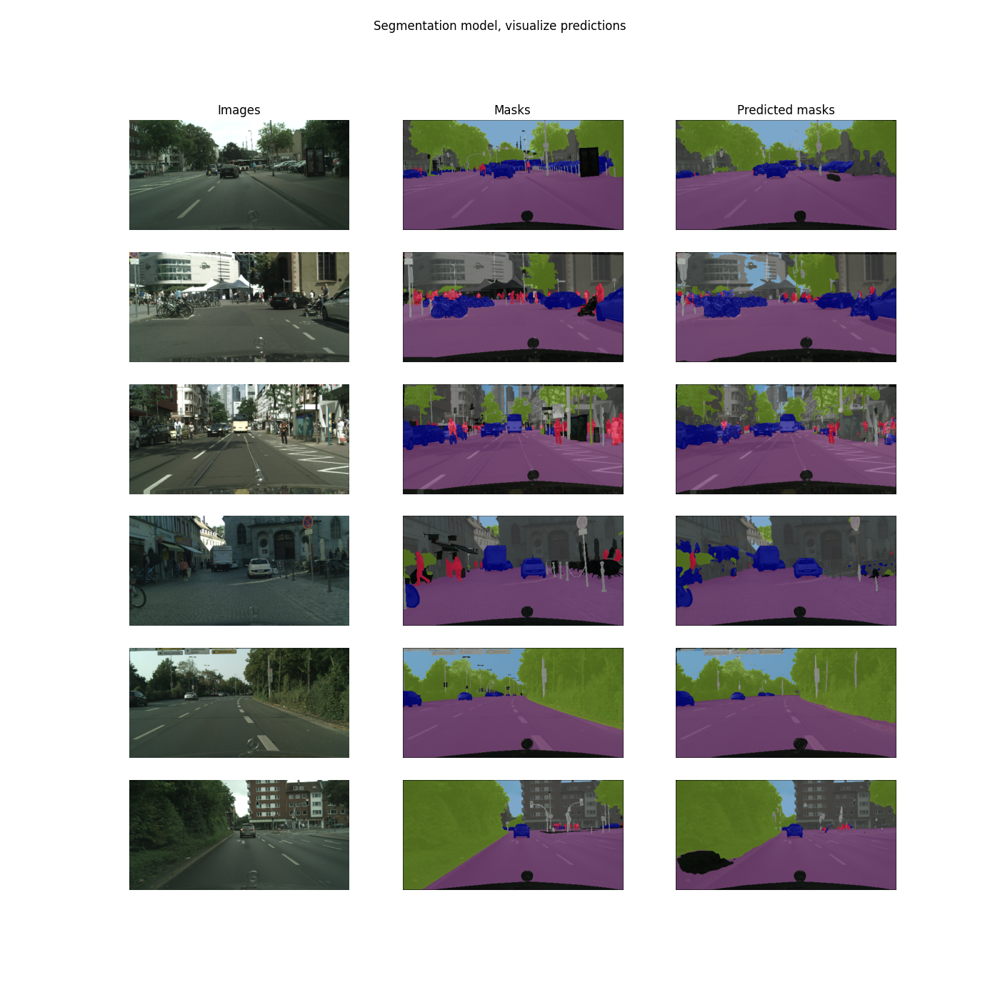

In [16]:
# use custom fonction to visualize some predictions
if "test_unet_resnet18.png" not in os.listdir("mySaves/images_tests") :
    unet_resnet18.load_weights("Patin_Clement_4_code_dashboard_062024/backend/models/unet_resnet18.h5")
    mf.testModel(model=unet_resnet18, test_gen=test_gen, n_images=6, cats_colors=cats_colors, random_state=16, save_path="mySaves/images_tests/test_unet_resnet18.png")
else :
    display(keras.preprocessing.image.load_img("mySaves/images_tests/test_unet_resnet18.png"))

## Nouvel algorithme : SegFormer

### Calcul mean and std

![](mySaves\images\sum_of_squares.jpg)

In [17]:
# instantiate a cityscapes generate with all training images
height = 256
width = 256*2

train_gen_for_mean_std = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(height, width),
    which_set="train",
    n_images=None,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False
)

In [18]:
# compute mean and std of cityscapes training data

if "mean.joblib" not in os.listdir("mySaves/cityscapes_mean_std") :
    # initiate images count
    number_of_images = 0
    # initiate channel-wise sum of pixels
    sum_of_pixels = np.array([0, 0, 0]).astype("float64")
    # initiate channel-wise sum of square pixels
    sum_of_square_pixels = np.array([0, 0, 0]).astype("float64")

    # itirate on batches and images
    for batch in train_gen_for_mean_std :
        for image in batch[0]/255 :
            # update count
            number_of_images += 1
            # update channel-wise sums
            sum_of_pixels += image.sum(axis=(0,1))
            sum_of_square_pixels += (image**2).sum(axis=(0,1))

    # count of pixels
    number_of_pixels = number_of_images * height * width
    # mean
    mean = sum_of_pixels / number_of_pixels
    # variance
    sum_of_squared_diff = sum_of_square_pixels - ((sum_of_pixels)**2) / number_of_pixels
    var = sum_of_squared_diff / number_of_pixels
    # std
    std = var**(0.5)
    # save
    dump(mean, "mySaves/cityscapes_mean_std/mean.joblib")
    dump(std, "mySaves/cityscapes_mean_std/std.joblib")

else :
    mean = load("mySaves/cityscapes_mean_std/mean.joblib")
    std = load("mySaves/cityscapes_mean_std/std.joblib")

In [19]:
mean

array([0.28655408, 0.32472863, 0.28353555])

In [20]:
std

array([0.18654688, 0.18973663, 0.18677004])

In [21]:
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

Dans le cadre de cette preuve de concept, nous cherchons à tester le modèle *SegFormer*.



### Dimensions des images

Le modèle ***SegFromer*** prend des images carrées en entrée. Il nous faut donc choisir avec quelles dimensions nous allons travailler. 

L'idée est d'**utiliser un nombre de pixels équivalent** tout en essayant de conserver un multiple de 32 (car l'encoder termine avec une résolution de H/32) :

In [22]:
# old dimensions
height_old = 256
width_old = 512
# new dimensions
# multiple of 32
# square
new_height = new_width = int(
    32 * np.ceil(
        np.sqrt(height_old * width_old) / 32
    )
    )

new_height

384

### Générateur de données

Un modèle `TFModel` *HuggingFace* est compatible avec le framework *keras*, mais conserve des particularités, notamment, au niveau du format :
- des données à lui fournir pour l'entraînement
- du résultat de la méthode `.predict()`

Nous transformons donc le générateur de données :
- utilisation à la place d'un `tf.data.Dataset`
- création de celui-ci grâce à la création d'une méthode `load_data()` qui réalise les mêmes opérations que précédemment, alliée avec la méthode `.map()`
- utilisation de `tf.numpy_function()` pour utiliser la librairie `albumentations` notamment
- préparation des images pour le *SegFormer* : normalisation avec les paramètre `mean` et `std`
- passage à une configuration *"channel first"*, pour la compatibilité avec *HuggingFace*
- batchs sous forme de dictionnaires {"pixel_values" : image, "labels" : mask}, pour la compatibilité avec *HuggingFace*
- utilisation des fonctionnalités de `tf.data.Dataset` pour l'échantillonnage, la mise en `batchs` et l'éventuel `shuffle`

In [23]:
# use custom class "generator"

# WITH augmentations for training
train_gen = mf.generator_for_transformers(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(new_height, new_width),
    which_set="train",
    n_images=None,
    cats=cats,
    image_mean=mean,
    image_std=std,
    augmentation=A.Compose(list_of_transforms),
    shuffle=True
)
train_dataset = train_gen.create_dataset()

# for validation, use of 'val' folder
# split and keep 70%
valid_gen = mf.generator_for_transformers(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(new_height, new_width),
    which_set="val",
    n_images=None,
    cats=cats,
    image_mean=mean,
    image_std=std,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)
valid_dataset = valid_gen.create_dataset()

# for test, use of 'val' folder again
# same split and keep remaining 30%
test_gen = mf.generator_for_transformers(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(new_height, new_width),
    which_set="val",
    n_images=None,
    cats=cats,
    image_mean=mean,
    image_std=std,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)
test_dataset = test_gen.create_dataset()

(32, 3, 384, 384) (32, 384, 384)


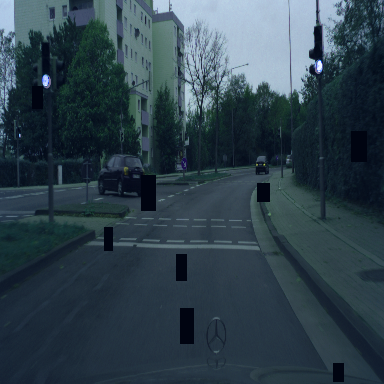

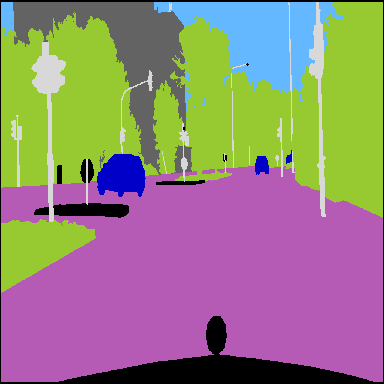

In [24]:
# tr_dataset = train_gen.create_dataset()

X = next(iter(train_dataset.take(1)))

print(X["pixel_values"].shape, X["labels"].shape)

test_preprocess_image = X["pixel_values"][0].numpy()
test_preprocess_mask = X["labels"][0].numpy()


display(keras.preprocessing.image.array_to_img(test_preprocess_image, data_format="channels_first"))

display(keras.preprocessing.image.array_to_img(cats_colors[test_preprocess_mask.astype(int)], data_format="channels_last"))

### Modèle

In [25]:
label2id = {label : i for i,label in enumerate(cats.keys())}
label2id

{'void': 0,
 'flat': 1,
 'construction': 2,
 'object': 3,
 'nature': 4,
 'sky': 5,
 'human': 6,
 'vehicle': 7}

In [26]:
id2label = {i : label for i,label in enumerate(cats.keys())}
id2label

{0: 'void',
 1: 'flat',
 2: 'construction',
 3: 'object',
 4: 'nature',
 5: 'sky',
 6: 'human',
 7: 'vehicle'}

In [27]:
# training characteristics
n_epochs = 10
steps_per_epoch = len(train_dataset)
total_iterations = n_epochs * steps_per_epoch

# learning rate schedule
learning_rate_schedule = keras.optimizers.schedules.PolynomialDecay(
    initial_learning_rate=6e-5,
    decay_steps=total_iterations,
    end_learning_rate=6e-6,
    power=1
)
# optimizer
optimizer = keras.optimizers.Adam(learning_rate=learning_rate_schedule)

# checkpoint
checkpoint = "nvidia/mit-b1"

# unet model with resnet backbone
segformer = TFAutoModelForSemanticSegmentation.from_pretrained(
    pretrained_model_name_or_path=checkpoint,
    # hidden_dropout_prob  = 0.05,
    # attention_probs_dropout_prob = 0.05,
    # classifier_dropout_prob = 0.15,
    # drop_path_rate = 0.15,
    image_size = new_height,
    num_labels = len(label2id),
    id2label = id2label,
    label2id = label2id,
)
# compile
segformer.compile(
    optimizer=optimizer,
)
# print summary
segformer.summary()

Some layers from the model checkpoint at nvidia/mit-b1 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b1 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model: "tf_segformer_for_semantic_segmentation"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 segformer (TFSegformerMain  multiple                  13151424  
 Layer)                                                          
                                                                 
 decode_head (TFSegformerDe  multiple                  528392    
 codeHead)                                                       
                                                                 
Total params: 13679816 (52.18 MB)
Trainable params: 13679304 (52.18 MB)
Non-trainable params: 512 (2.00 KB)
_________________________________________________________________


### Entraînement

In [28]:
if "segformer_results.joblib" not in os.listdir("mySaves/results") :
    # use saved weights if they exists
    if "segformer.h5" in os.listdir("Patin_Clement_4_code_dashboard_062024/backend/models") :
        segformer.load_weights("Patin_Clement_4_code_dashboard_062024/backend/models/segformer.h5")
        training_time = load("mySaves/results/segformer_training_time.joblib")

    else :
        # define callback
        callbacks = [
            KerasMetricCallback(metric_fn=mf.compute_metrics, eval_dataset=valid_dataset, batch_size=batch_size, label_cols=["labels"])
        ]
        # initiate timer
        start = time.time()
        # fit
        history = segformer.fit(
            x=train_dataset,
            steps_per_epoch=len(train_dataset),
            epochs=n_epochs,
            validation_data=valid_dataset,
            callbacks=callbacks
        )
        # get training time
        training_time = time.time() - start
        # save
        segformer.save_weights("Patin_Clement_4_code_dashboard_062024/backend/models/segformer.h5")
        dump(training_time,"mySaves/results/segformer_training_time.joblib")
        dump(history.history, "mySaves/results/segformer_history.joblib")

    # compute scores on validation set
    # preds
    eval_preds = segformer.predict(valid_dataset).logits
    # labels
    eval_labels = np.array([
        labels for batch in list(valid_dataset.as_numpy_iterator()) for labels in batch["labels"] 
    ])
    scores = mf.compute_metrics((eval_preds, eval_labels))
    dump(scores, "mySaves/results/segformer_results.joblib")

else :
    # load
    scores = load("mySaves/results/segformer_results.joblib")
    training_time = load("mySaves/results/segformer_training_time.joblib")
    history = load("mySaves/results/segformer_history.joblib")

Regardons la courbe d'apprentissage :

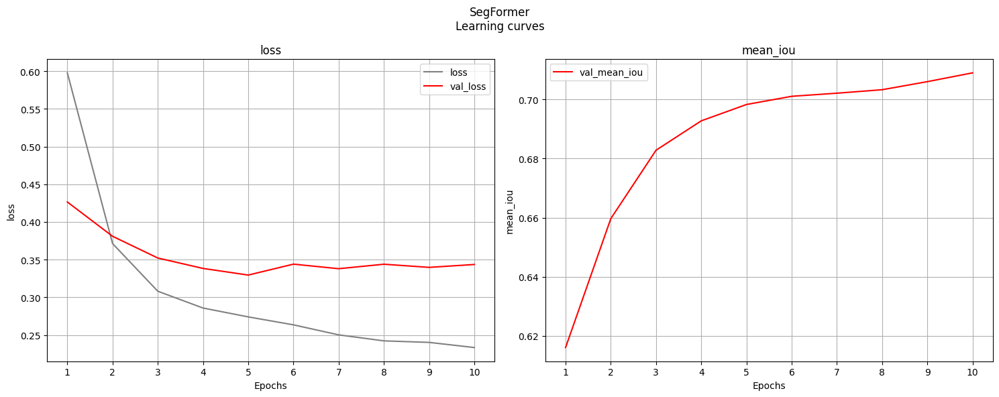

In [29]:
# use custom fonction to visualize some predictions
if "segformer_learning_curve.png"  in os.listdir("mySaves/results") :
    mf.plot_learning_curves(
        history_dict=history, 
        list_of_metrics=["loss", "mean_iou"], 
        title="SegFormer\nLearning curves",
        save_path="mySaves/results/segformer_learning_curve.png")
else :
    display(keras.preprocessing.image.load_img("mySaves/results/segformer_learning_curve.png"))

In [30]:
# add results
new_results = ["segformer", "nvidia/mit-b1"] + [scores["val_mean_iou"]] + [training_time]
results_tab.loc[results_tab.shape[0],:] =  new_results
results_tab

,model,backbone,val_iou,training_time
0,unet,resnet18,0.648616,11669.756623
1,segformer,nvidia/mit-b1,0.709002,54777.802238


### Test sur quelques images

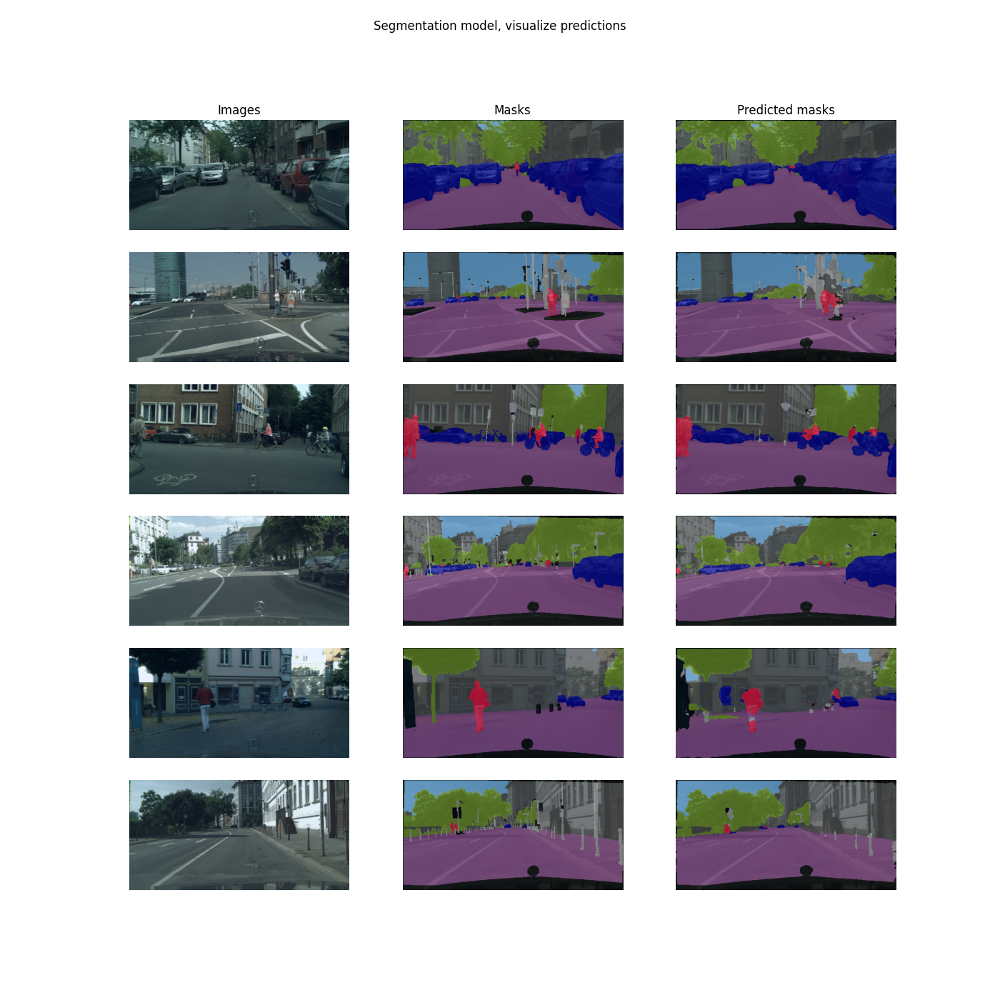

In [31]:
# use custom fonction to visualize some predictions
if "test_segformer.png" not in os.listdir("mySaves/images_tests") :
    segformer.load_weights("Patin_Clement_4_code_dashboard_062024/backend/models/segformer.h5")
    mf.plotSegformerModel(model=segformer, test_dataset=test_dataset, n_images=6, cats_colors=cats_colors, alpha=0.7, save_path="mySaves/images_tests/test_segformer.png")
else :
    display(keras.preprocessing.image.load_img("mySaves/images_tests/test_segformer.png"))

## Interprétabilité

### La librairie `Xplique`

Cette librairie a été développée par les équipes de *DEpendable & Explainable Learning* (*DEEL*), et met à disposition des outils d'interprétabilité pour des modèles de *Computer Vision*.

Elle permet d'explorer différentes facettes de l'explicabilité en *CV* :
- la ***Feature attribution***, celle qui va nous intéresser :
    - **méthode locale**
    - d'une manière générale, consiste à modifier l'image en entrée et à mesurer l'impact que cela a sur la sortie du modèle
    - il existe plusieurs méthodes :
        - faire varier sensiblement chaque pixel. On mesure alors l'impact précis de ce pixel
        - cacher une partie de l'image (par exemple avec un patch noir) et faire glisser ce patch petit à petit. On peut alors déduire des variations du modèle les zones critiques
        - utiliser directement les features maps, les poids, les gradients du modèle. Par exemple, pour une image données, pondérer les features maps avec le gradient associé à la classe prédite. Cela permet de mettre en valeur les zones ayant le plus contribué à cette classe.
- la ***Feature visualization*** :
    - **méthode globale**
    - nécessite d'avoir accès aux valeurs de chaque neurone. Nous ne pourrons donc pas l'utiliser sur le *SegFormer*.
    - permet d'expliquer comment un neurone spécifique, un canal spécifique ou encore une couche entière à contruit sa compréhension des images d'entraînement
    - pour réaliser cela :
        - on sélectionne l'élément à expliquer, 
        - on calcule le gradient juste entre cet élement et l'entrée du modèle obtenue avec une image aléatoire
        - on utilise ce gradient, très partiel donc, pour optimiser l'image d'entrée afin qu'elle maximise la valeur de l'élément
        - on obtient ainsi une image caractérisant l'élément en question
- le ***Concept-based*** :
    - **méthode globale**
    - applicable pour de la classification ET nécessite d'avoir accès aux coucges du modèles. Nous ne l'utiliserons donc pas sur le *Segformer*
    - l'idée est de recherche non pas des zones d'une image, mais des concepts familiers pour un humain
    - une méthode, appelée *CRAFT* consiste à :
        - choisir une classe à explorer, par exemple "chien"
        - choisir une sélection d'images pour lesquelles le modèle a prédit la classe "chien"
        - choisir une couche du modèle :
            - avant cette couche, sont calculées les valeurs d'activation de nos images
            - après cette couche, les logits
        - sur toutes les images, on choisit aléatoirement des *crops* que l'on passe au modèle, et on stocke les activations de celles-ci
        - on factorise ces activations pour en extraire les concepts
        - on détermine l'importance globale de chaque concept
        - il est même possible de déterminer les concepts les plus importants pour une image donnée, et de les localiser dans l'image

Pour le *Segformer* nous seront obliger de nous contenter de la *Feature Attribution*. `Xplique` met à disposition un module dédié à la segmentation sémantique. L'idée directrice est d'expliquer une partie de l'image d'une certaine classe (**à pointer à la main**), et d'utiliser une méthode de *Feature Attribution* sur cette zone, en revenant en quelque sorte à un problème de classification.

### Compatibilité `transformers` et `Xplique` ?

`Xplique` est conçu pour fonctionner avec le framework *TensorFlow*. La librairie met à disposition un *wrapper* pour rendre compatible certaines fonctionnalités également avec *PyTorch*, mais rien pour *HuggingFace*.

Après étude du code du *wrapper* *PyTorch* et échange avec les auteurs de la librairie, nous avons créé la class `WrapperSegFormer` :

In [32]:
# wrap segformer
segformer.load_weights("Patin_Clement_4_code_dashboard_062024/backend/models/segformer.h5")
wrapped_model = mf.WrapperSegFormer(segformer)

# Define a Keras Input and connect it to the model
input_shape = (new_height, new_width, 3)
inputs = tf.keras.Input(shape=input_shape)
outputs = wrapped_model(inputs)

# Create a Keras Model
connected_wrapped_model = tf.keras.Model(inputs, outputs)

### Choix de quelques exemples

Sélectionnons 2 images à expliquer :

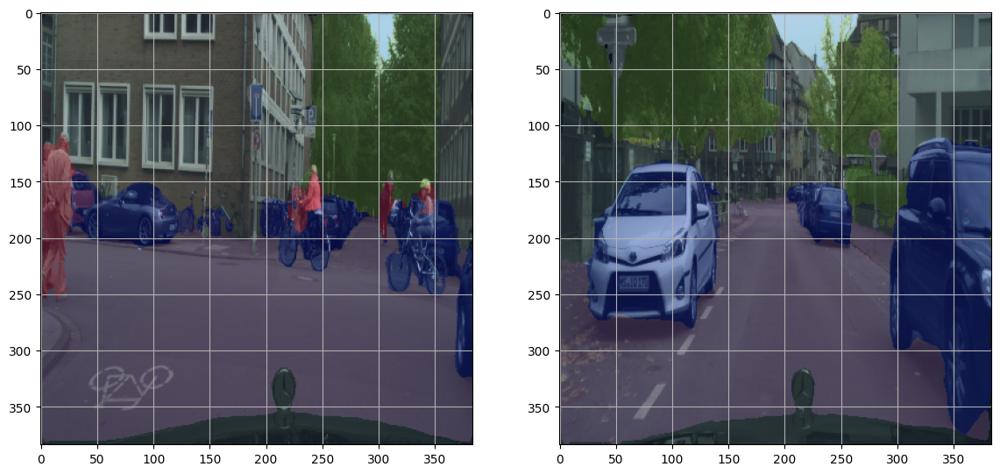

In [33]:
if "examples.joblib" not in os.listdir("mySaves/explainability") :
    # pick images
    datapoints = list(test_dataset.unbatch().as_numpy_iterator())
    datapoints = [datapoints[2], datapoints[11]]
    images_tf = np.array([datapoint['pixel_values'] for datapoint in datapoints])

    # transpose (segformer is now a keras model, so we need channel last)
    images_tf = tf.transpose(images_tf, (0,2,3,1))

    # predict
    tf_outputs = connected_wrapped_model(images_tf)

    # save
    examples = dict(
        images_tf=images_tf,
        tf_outputs=tf_outputs,
    )
    dump(examples, "mySaves/explainability/examples.joblib")

else :
    examples = load("mySaves/explainability/examples.joblib")
    images_tf = examples["images_tf"]
    tf_outputs = examples["tf_outputs"]

# get categories
pred_segs = np.argmax(tf_outputs, axis=-1)

# apply color map
color_segs = np.array([cats_colors[pred_seg] for pred_seg in pred_segs])

# merge with image
# first, scale original image to 255
images = [image.numpy() for image in images_tf]
images = [(image-image.min())/(image.max()-image.min())*255 for image in images]
images = np.array(images).astype(int)
# merge
alpha = 0.3
images_with_color_seg = (alpha * color_segs + (1 - alpha) * images).astype(int)

# plot with grid to choose zones
fig, axs = plt.subplots(1, len(images), figsize=(14,7))
for j, ax in enumerate(axs) :
    ax.imshow(images_with_color_seg[j])
    ax.grid()
plt.show()


Nous avons appliqué le *SegFormer* sur nos 2 images et affiché **une grille pour nous permettre de sélectionner nos zones à expliquer**. Pour nos 2 images nous pouvons par exemple essayer d'expliquer :
- image 1 :
    - le couple situé à gauche, environ (150, 15)
    - la voiture située à gauche, environ (175, 75)
    - le vélo situé au centre, environ (200, 230)
- image 2 :
    - la voiture située à gauche, environ (200, 75)
    - la demie voiture située à droite, environ (225, 350)
    - un arbre situé à droite, environ (75, 275)

### Image 1

Commençons par l'image 1 :

In [34]:
# extract image 1 logits
i = 0
predictions = tf_outputs[i]

#### Calcul des `explanations`

Pour notre image :
- nous créons nos `targets` permettant de spécifier ce que l'on doit expliquer. Nous utilisons 2 fonctions : `get_connected_zone` (pour toute la zone avec la classe en question) et `get_in_out_border` (pour la limite entre la zone sélectionnée et les autres zones)
- nous faisons cela pour les trois zones sélectionnées
- nous créons un `explainer` permettant d'appliquer une technique de *feature attribution* à partir de notre `connected_wrapped_model` compatible
- nous choisissons `SobolAttributionMethod`, qui n'est pas juste une technique reprise au sein de `Xplique`, mais qui a plutôt été développée directement par ses créateurs
![](mySaves\images\sobol.png)
- nous pouvons ensuite générer chaque explication à partir d'une `target` grâce à la méthode `.explain()`

In [35]:
# compute explanations on these zones via HSIC method

if "image_1_explanations.joblib" not in os.listdir("mySaves/explainability") :
    # specify the coordinates of a point in the zones to explain
    human_coordinates = (150, 15)
    car_coordinates = (175, 75)
    bike_coordinates = (200, 230)

    # compute the `targets` parameter to explain the specified zones
    human_zone_predictions = get_connected_zone(predictions, human_coordinates)
    car_zone_predictions = get_connected_zone(predictions, car_coordinates)
    bike_zone_predictions = get_connected_zone(predictions, bike_coordinates)

    # compute the `targets` parameter to explain the border of the specified zones
    human_borders_predictions = get_in_out_border(human_zone_predictions)
    car_borders_predictions = get_in_out_border(car_zone_predictions)
    bike_borders_predictions = get_in_out_border(bike_zone_predictions)

    # tile and stack tensors to call the method once by image
    images_1 = tf.tile([images_tf[i]], multiples=(6, 1, 1, 1))
    targets_1 = tf.stack([
        human_zone_predictions,  
        car_zone_predictions,
        bike_zone_predictions, 
        human_borders_predictions,
        car_borders_predictions, 
        bike_borders_predictions
        ])
    
    # # initiate an explainer
    # explainer = HsicAttributionMethod(
    #     connected_wrapped_model, 
    #     operator=xplique.Tasks.SEMANTIC_SEGMENTATION,
    #     batch_size=8,
    #     nb_design=750,
    #     grid_size=12
    #     )
    
    # initiate an explainer
    explainer = SobolAttributionMethod(
        connected_wrapped_model, 
        operator=xplique.Tasks.SEMANTIC_SEGMENTATION,
        batch_size=8,
        nb_design=32,
        grid_size=13
        )

    # explain
    explanations_1 = explainer.explain(images_1, targets_1)
    # explanations_1 = 1

    # save
    image_1_explanations = dict(
        targets=targets_1,
        explanations=explanations_1,
    )
    dump(image_1_explanations, "mySaves/explainability/image_1_explanations.joblib")

else :
    # tile tensors to call the method once by image
    images_1 = tf.tile([images_tf[i]], multiples=(6, 1, 1, 1))
    # load
    image_1_explanations = load("mySaves/explainability/image_1_explanations.joblib")
    targets_1 = image_1_explanations["targets"]
    explanations_1 = image_1_explanations["explanations"]


In [36]:
# from xplique.metrics import Deletion
# metric = Deletion(
#     model=connected_wrapped_model, 
#     operator=xplique.Tasks.SEMANTIC_SEGMENTATION,
#     inputs=images_1, 
#     targets=targets_1, 
#     batch_size=8,
#     baseline_mode=0, 
#     steps=10, 
#     max_percentage_perturbed=0.5
#     )

# metric(explanations_1)


#### Visualiser les `explanations`

`Xplique` met à disposition un module `plots` permettant de visualiser les explications :

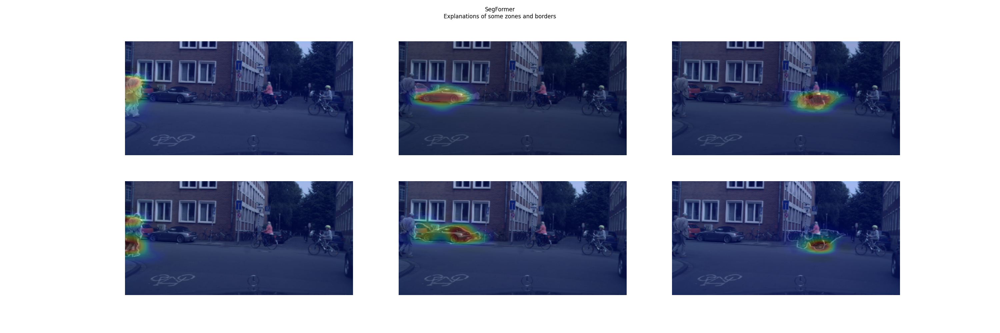

In [37]:
# use custom function plot_explanations
if "image_1_plot.png" not in os.listdir("mySaves/explainability") :
    # use custom function "plot_explanations"
    mf.plot_explanations(
        explanations=explanations_1, 
        targets=targets_1, 
        images=images_1, 
        alpha_mask=0.5, 
        alpha_explain_plot=0.25, 
        output_size=(256, 512), 
        title="SegFormer\nExplanations of some zones and borders",
        save_path="mySaves/explainability/image_1_plot.png"
        )

else :
    display(Image.open("mySaves/explainability/image_1_plot.png"))

Ce que l'on peut en retenir :
- couple :
    - les bras et le dos semblent avoir conditionné la détection de cette zone
    - le dos et les jambes ont plus participé à la limitation de cette zone
- voiture :
    - zone : bas de caisse et roues
    - séparations : l'arrière de la voiture
- vélo :
    - zone : fondu avec le groupe de voitures en arrière plan, mais le haut des roues semble avoir conduit à l'inclusion du vélo dans le groupe
    - limite : la roue arrière a eu beaucoup d'influence

### Image 2

Réalisons les mêmes étapes avec l'image 2.

In [38]:
# extract image 2 logits
i = 1
predictions = tf_outputs[i]

#### Calcul des `explanations`

In [39]:
# compute explanations on these zones via HSIC method

if "image_2_explanations.joblib" not in os.listdir("mySaves/explainability") :
    # specify the coordinates of a point in the zones to explain
    left_car_coordinates = (200, 75)
    half_car_coordinates = (225, 350)
    tree_coordinates = (75, 275)

    # compute the `targets` parameter to explain the specified zones
    left_car_zone_predictions = get_connected_zone(predictions, left_car_coordinates)
    half_car_zone_predictions = get_connected_zone(predictions, half_car_coordinates)
    tree_zone_predictions = get_connected_zone(predictions, tree_coordinates)

    # compute the `targets` parameter to explain the border of the specified zones
    left_car_borders_predictions = get_in_out_border(left_car_zone_predictions)
    half_car_borders_predictions = get_in_out_border(half_car_zone_predictions)
    tree_borders_predictions = get_in_out_border(tree_zone_predictions)

    # tile and stack tensors to call the method once by image
    images_2 = tf.tile([images_tf[i]], multiples=(6, 1, 1, 1))
    targets_2 = tf.stack([
        left_car_zone_predictions,  
        half_car_zone_predictions,
        tree_zone_predictions, 
        left_car_borders_predictions,
        half_car_borders_predictions, 
        tree_borders_predictions
        ])
    
    # # initiate an explainer
    # explainer = HsicAttributionMethod(
    #     connected_wrapped_model, 
    #     operator=xplique.Tasks.SEMANTIC_SEGMENTATION,
    #     batch_size=8,
    #     nb_design=750,
    #     grid_size=12
    #     )
    
    # initiate an explainer
    explainer = SobolAttributionMethod(
        connected_wrapped_model, 
        operator=xplique.Tasks.SEMANTIC_SEGMENTATION,
        batch_size=8,
        nb_design=32,
        grid_size=13
        )

    # explain
    explanations_2 = explainer.explain(images_2, targets_2)
    # explanations_2 = 1

    # save
    image_2_explanations = dict(
        targets=targets_2,
        explanations=explanations_2,
    )
    dump(image_2_explanations, "mySaves/explainability/image_2_explanations.joblib")

else :
    # tile tensors to call the method once by image
    images_2 = tf.tile([images_tf[i]], multiples=(6, 1, 1, 1))
    # load
    image_2_explanations = load("mySaves/explainability/image_2_explanations.joblib")
    targets_2 = image_2_explanations["targets"]
    explanations_2 = image_2_explanations["explanations"]


#### Visualiser les `explanations`

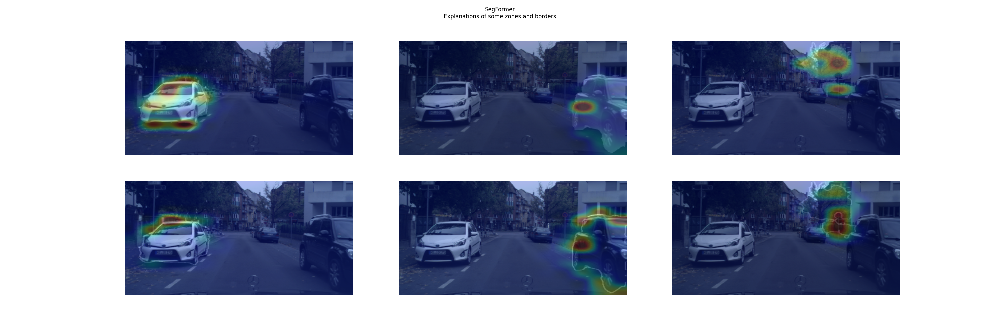

In [40]:
# use custom function plot_explanations
if "image_2_plot.png" not in os.listdir("mySaves/explainability") :
    # use custom function "plot_explanations"
    mf.plot_explanations(
        explanations=explanations_2, 
        targets=targets_2, 
        images=images_2, 
        alpha_mask=0.5, 
        alpha_explain_plot=0.25, 
        output_size=(256, 512), 
        title="SegFormer\nExplanations of some zones and borders",
        save_path="mySaves/explainability/image_2_plot.png"
        )

else :
    display(Image.open("mySaves/explainability/image_2_plot.png"))

Ce que l'on peut en retenir :
- voiture de gauche :
    - zone : pars-brise, feu, roues avant
    - limite : le haut de la voiture a eu un gros impact sur le positionnement de cette séparation
- demie voiture de droite :
    - zone : dessus roue arrière
    - séparations : idem, ainsi que la haut de la voiture
- arbre de droite :
    - zone : zones les plus denses
    - limite : le panneau a beaucoup d'influence sur cette séparation

## Pour la mise en prodcution

Nous allons enregistré quelques images pour pouvoir effectuer des tests en production :

In [41]:
# save some images for the Flask web app

if "1.png" not in os.listdir("Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_images") :

    n_images = 30

    # create a generator
    gen_for_prod = mf.generator(
        batch_size=batch_size,
        images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
        masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
        image_size=(new_height, new_height*2),
        which_set="val",
        cats=cats,
    )


    # random seed
    np.random.seed(seed=1)

    # pick one batch
    batch_idx = np.random.choice(np.arange(len(gen_for_prod)), size = n_images)
    image_idx = np.random.choice(np.arange(32), size = n_images)

    some_images = np.array([gen_for_prod[i][0][j] for i, j in zip(batch_idx, image_idx)])
    some_masks = np.array([gen_for_prod[i][1][j] for i, j in zip(batch_idx, image_idx)])

    # put class labels in one channel
    some_masks = np.argmax(some_masks, axis=3)
    # colors
    some_masks = cats_colors[some_masks]

    # save
    for i in range(n_images) :
        keras.utils.save_img(path = "Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_images/"+str(i+1)+".png", x = some_images[i])
        keras.utils.save_img(path = "Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_masks/"+str(i+1)+".png", x = some_masks[i])

    # create and save a black image
    black_image = np.zeros(shape=(new_height, new_height*2, 3), dtype="uint8")
    keras.utils.save_img(path = "Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_images/black.png", x = black_image)
    keras.utils.save_img(path = "Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_masks/black.png", x = black_image)

else :
    # load
    n_images = len(os.listdir("Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_images"))
    
    some_images = np.array([keras.preprocessing.image.load_img("Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_images/"+str(i+1)+".png", target_size=(new_height, new_height*2)) for i in range(n_images)])
    some_masks = np.array([keras.preprocessing.image.load_img("Patin_Clement_4_code_dashboard_062024/frontend/test_datapoints/test_masks/"+str(i+1)+".png", target_size=(new_height, new_height*2)) for i in range(n_images)])

    # to array
    some_images = np.array([keras.preprocessing.image.img_to_array(image, dtype="uint8") for image in some_images])
    some_masks = np.array([keras.preprocessing.image.img_to_array(mask, dtype="uint8") for mask in some_masks])


## Test fonction affichage 1 explication

In [42]:
image_1_zones = ["left couple", "left car", "central bike"]
image_2_zones = ["left car", "half right car", "right tree"]

In [43]:
image_1_zones = {"left couple - zone" : 0, "left car - zone" : 1, "central bike - zone" : 2, "left couple - border" : 3, "left car - border" : 4, "central bike - border" : 5}
image_2_zones = {"left car - zone" : 0, "half right car - zone" : 1, "right tree - zone" : 2, "left car - border" : 3, "half right car - border" : 4, "right tree - border" : 5}

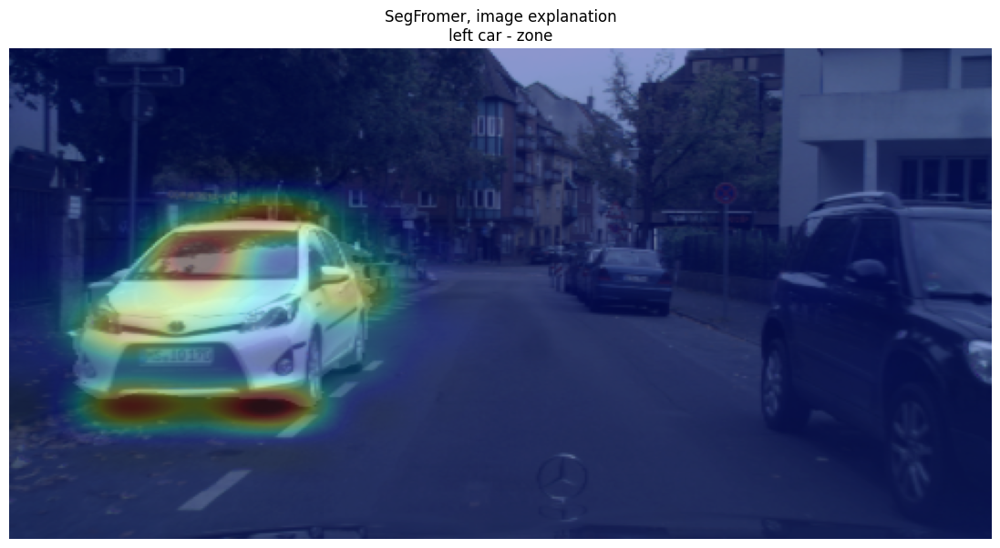

In [44]:
image_2_zone_name = "left car - zone"

mf.plot_explanation(
    image=images_tf[1], 
    zone_name=image_2_zone_name,
    explanation=explanations_2[image_2_zones[image_2_zone_name]], 
    target=targets_2[image_2_zones[image_2_zone_name]], 
    alpha_mask=0.5, 
    alpha_explain_plot=0.25, 
    output_size=(256, 512), 
    )

        

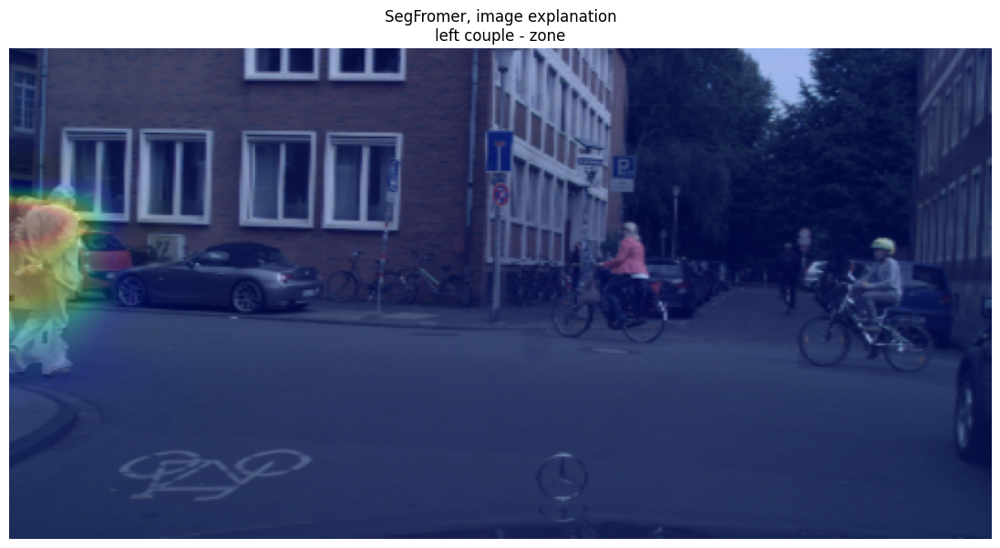

In [45]:
image_1_zone_name = "left couple - zone"

mf.plot_explanation(
    image=images_tf[0], 
    zone_name=image_1_zone_name,
    explanation=explanations_1[image_1_zones[image_1_zone_name]], 
    target=targets_1[image_1_zones[image_1_zone_name]], 
    alpha_mask=0.5, 
    alpha_explain_plot=0.25, 
    output_size=(256, 512), 
    )


## Test fonction prédiction avec modèles

1/1 [==============================] - 3s 3s/step


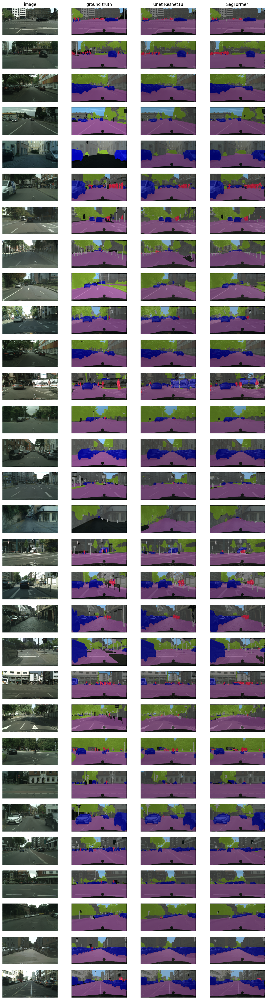

In [46]:

output_images, output_masks, segformer_preds = mf.predict_with_segformer_model(segformer, some_images, some_masks, cats_colors, alpha=0.7)

unet_resnet18.load_weights("Patin_Clement_4_code_dashboard_062024/backend/models/unet_resnet18.h5")
_, _, unet_resnet18_preds = mf.predict_with_unet_model(unet_resnet18, some_images, some_masks, cats_colors, alpha=0.7)

fig, ax = plt.subplots(n_images, 4, figsize=(14, 14/2/4*n_images))

for j, ims in enumerate([output_images, output_masks, unet_resnet18_preds, segformer_preds]) :
    for i in range(n_images) :
        # show image
        ax[i, j].imshow(ims[i])
        # remove axis
        ax[i, j].axis(False)

# title
for j, title in enumerate(["image", "ground truth", "Unet-Resnet18", "SegFormer"]) :
    ax[0,j].set_title(title)
